# Module 3 and 4 Exercise

In these exercises, we will plot some statistical plots about a data set. Whether using `R (ggplot2)` or `Python (plotnine)`, have your `ggplot2` cheat sheets and documentation handy to find the right parameters for the functions.

Once you choose which language you want to use, then switch the language kernel by clicking the top right corner of a notebook menu bar (Not the JupyterLab menu bar.)

Let's read the house sales data.

In [1]:
# Please uncomment the following lines if you use Python
# -------------------------------------------------------
import pandas as pd
import numpy as np
import plotnine as pn
from plotnine import *
import warnings
warnings.filterwarnings('ignore')

County_data = pd.read_csv("kc_house_data.csv")
County_data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180.0,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170.0,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770.0,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050.0,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680.0,0,1987,0,98074,47.6168,-122.045,1800,7503


Let's check the observations that the `bedrooms` are more than tens.


In [2]:
County_data.loc[County_data.bedrooms > 10]

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
8757,1773100755,20140821T000000,520000.0,11,3.00,3000,4960,2.0,0,0,...,7,2400.0,600,1918,1999,98106,47.5560,-122.363,1420,4960
15870,2402100895,20140625T000000,640000.0,33,1.75,1620,6000,1.0,0,0,...,7,1040.0,580,1947,0,98103,47.6878,-122.331,1330,4700


Two rows in the dataset have more bedrooms than 10, but the price is very low. Let's first remove those outliers (anomalies) from the data.

In [3]:
County_data = County_data.loc[County_data.bedrooms <= 10]

**Exercise 1:** Use a function or method to summarize the data structure and give your best guess about (1) __which attributes are **nominal** variables__. (2) **Justify your answer.** 

In [4]:
# Your Code Here
# ------------------------
print(County_data.info())
print(County_data.describe())

nominal_variables = ["id", "date", "waterfront", "view", "zipcode"]
print("\nNominal variables:", ", ".join(nominal_variables))

<class 'pandas.core.frame.DataFrame'>
Index: 21611 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21611 non-null  int64  
 1   date           21611 non-null  object 
 2   price          21611 non-null  float64
 3   bedrooms       21611 non-null  int64  
 4   bathrooms      21611 non-null  float64
 5   sqft_living    21611 non-null  int64  
 6   sqft_lot       21611 non-null  int64  
 7   floors         21611 non-null  float64
 8   waterfront     21611 non-null  int64  
 9   view           21611 non-null  int64  
 10  condition      21611 non-null  int64  
 11  grade          21611 non-null  int64  
 12  sqft_above     21609 non-null  float64
 13  sqft_basement  21611 non-null  int64  
 14  yr_built       21611 non-null  int64  
 15  yr_renovated   21611 non-null  int64  
 16  zipcode        21611 non-null  int64  
 17  lat            21611 non-null  float64
 18  long       

**Answer to specify nominal variables and why do you think those are nominal:**

Nominal variables are categorical variables that represent individual categories or groups without any particular order or ranking.
In our dataset - kc_house_data.csv, we can identify nominal variables by considering the data characteristics of each column.
1. id: Assuming it represents a unique identifier, it is likely nominal.
2. Date: If it represents a date without an ordinal number, it can be considered nominal.
3. Waterfront: Indicates whether the property is waterfront.
4. view: If no order is specified, it represents a different view.
5. Postal Code: Represents a distinct geographic area without any internal ordering.

**Exercise 2:** Map the **sqft_living** and **price** attributes to x and y axes of a scatter plot, respectively. Use some alpha transparency.

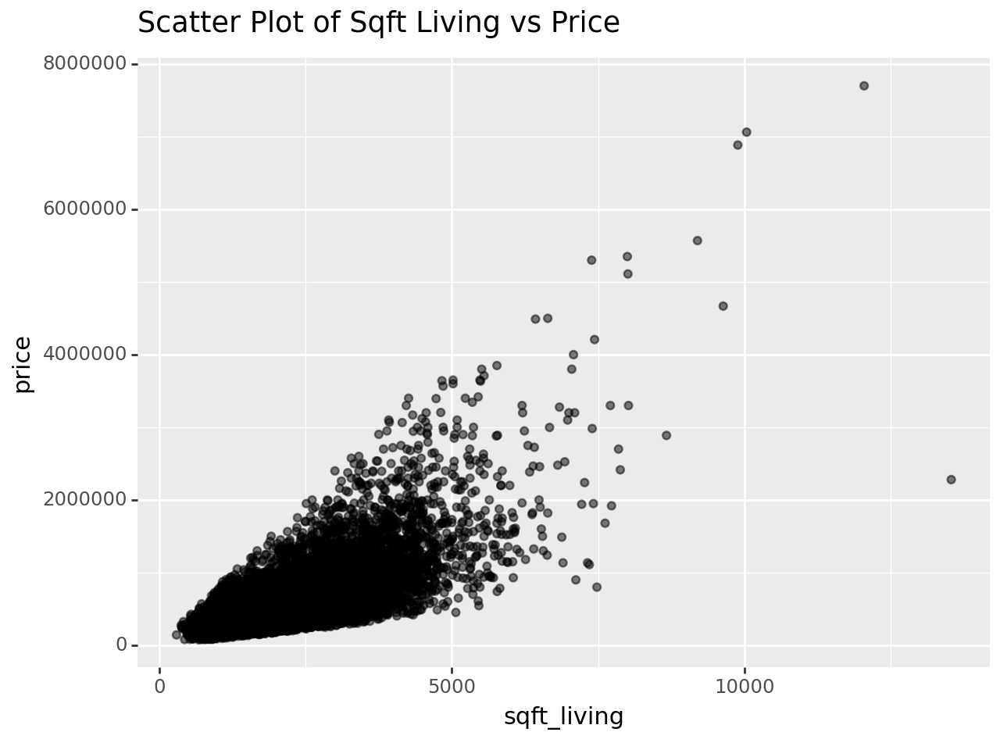

<Figure Size: (640 x 480)>

In [5]:
# Your Code Here
# ------------------------
plot = (ggplot(County_data, aes(x='sqft_living', y='price')) + 
geom_point(alpha=0.5) +
ggtitle('Scatter Plot of Sqft Living vs Price') +
labs(x="sqft_living", y="price"))
plot

If you draw a scatter plot properly, you cannot really see anything here. Let's try the same plot with log scales.

**Exercise 3**: Plot the above axes (both **x** and **y**) in log10 scale.


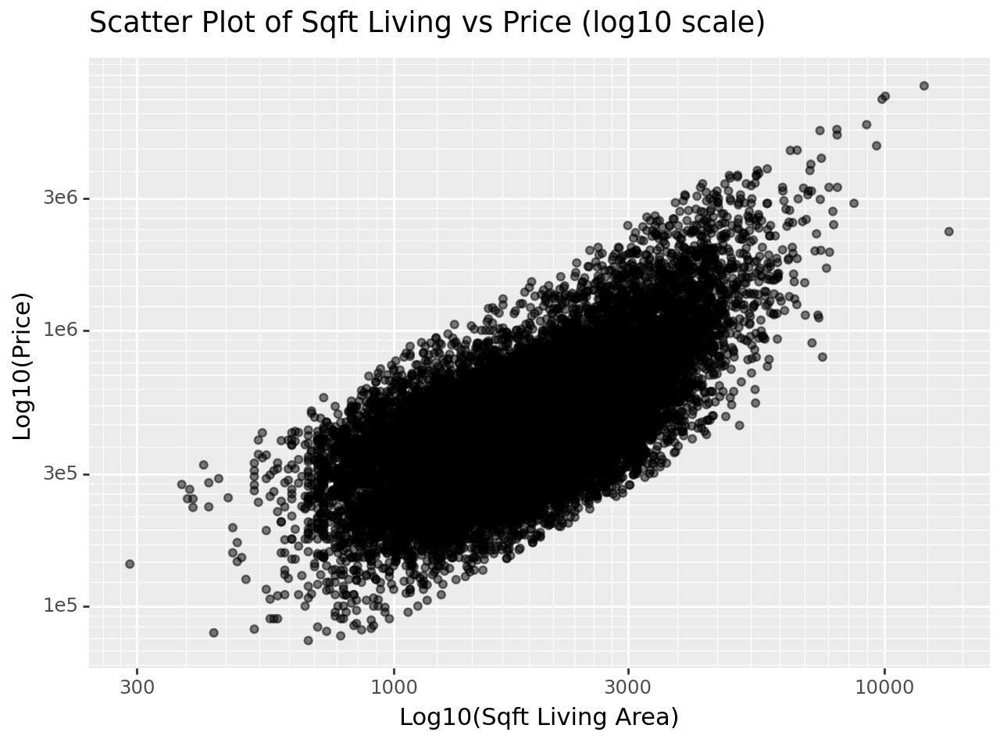

<Figure Size: (640 x 480)>

In [6]:
# Your Code Here
# ------------------------
plot_log = (
    ggplot(County_data, aes(x='sqft_living', y='price')) +
    geom_point(alpha=0.5) +
    scale_x_log10() +
    scale_y_log10() +
    ggtitle('Scatter Plot of Sqft Living vs Price (log10 scale)') +
    xlab('Log10(Sqft Living Area)') +
    ylab('Log10(Price)')
)

plot_log

This gives a better relation between price and square footage. 


Let's plot a histogram of price; it is the distribution of prices for all houses. 

**Exercise 4:** Plot a **histogram** of **price** with a **binwidth** of 30000.

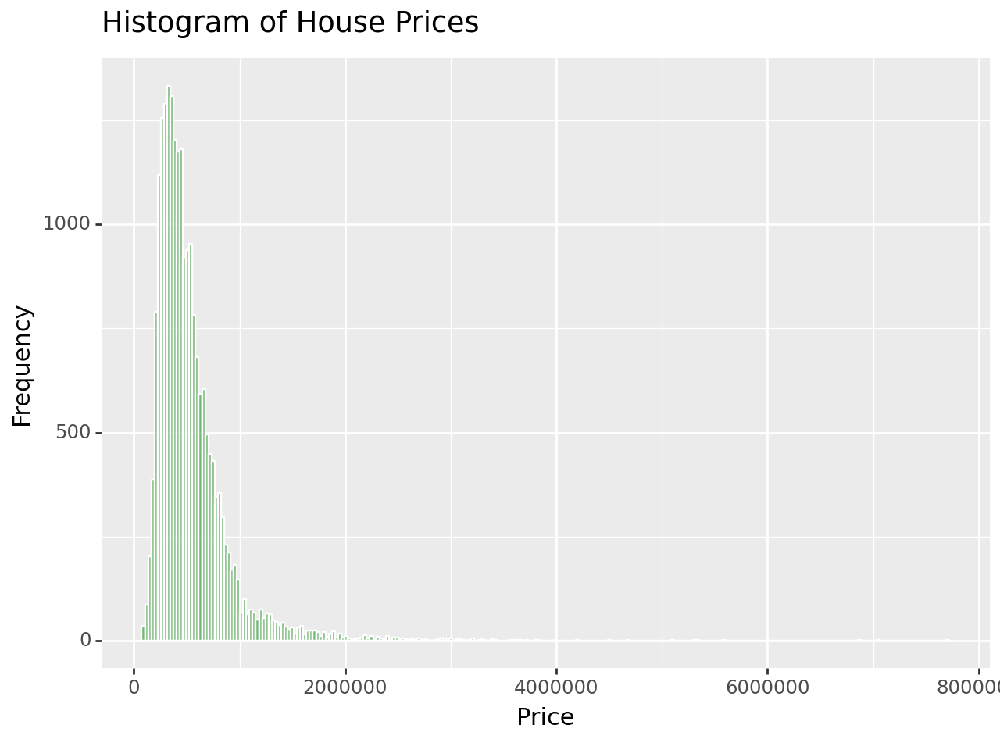

<Figure Size: (640 x 480)>

In [7]:
# Your Code Here
# ------------------------
hist_plot = (ggplot(County_data, aes(x='price')) + 
              geom_histogram(binwidth=30000, fill='green', color='white', alpha=0.5) +
              labs(title="Histogram of House Prices", x="Price",y='Frequency'))
hist_plot

We can also plot the probability density function of the price, it will look like a smoothed version of the histogram.

**Exercise 5:** Plot the density of **price** using **geom_density**. 

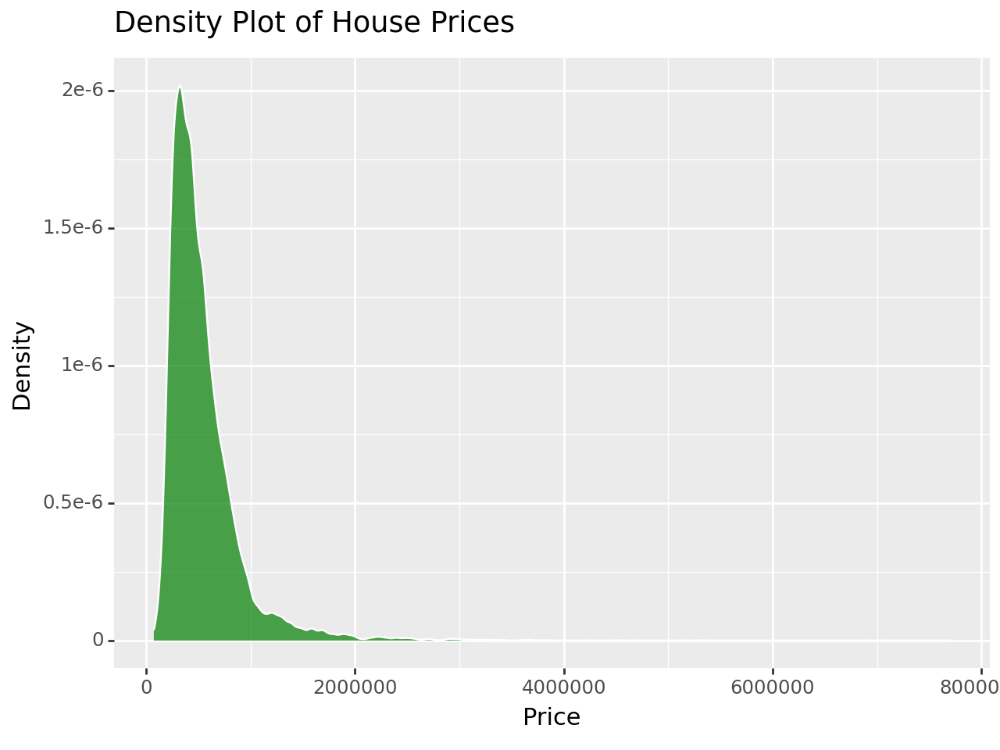

<Figure Size: (640 x 480)>

In [8]:
# Your Code Here
# ------------------------
density_plot = (
    ggplot(County_data, aes(x='price')) +
    geom_density(fill='green', color='white', alpha=0.7) +
    labs(title="Density Plot of House Prices", x="Price",y='Density')
)
density_plot

Let's work on the subset of the data; we will look only at houses that are less than $2M. 

In [9]:
# Because the price unit changed from $ to $1,000
# lowprice_houses = County_data.loc[County_data.price1000 < (2 * 1e6 / 1000)]
lowprice_houses = County_data.loc[County_data.price<2000000]


---

We can plot **multiple densities** on the same plot to see how the price distribution differs with respect to some attribute. We should use alpha transparency in geom_density to see the different distributions.

**Exercise 6:** Plot multiple densities of **price** with respect to **number of bedrooms**. 

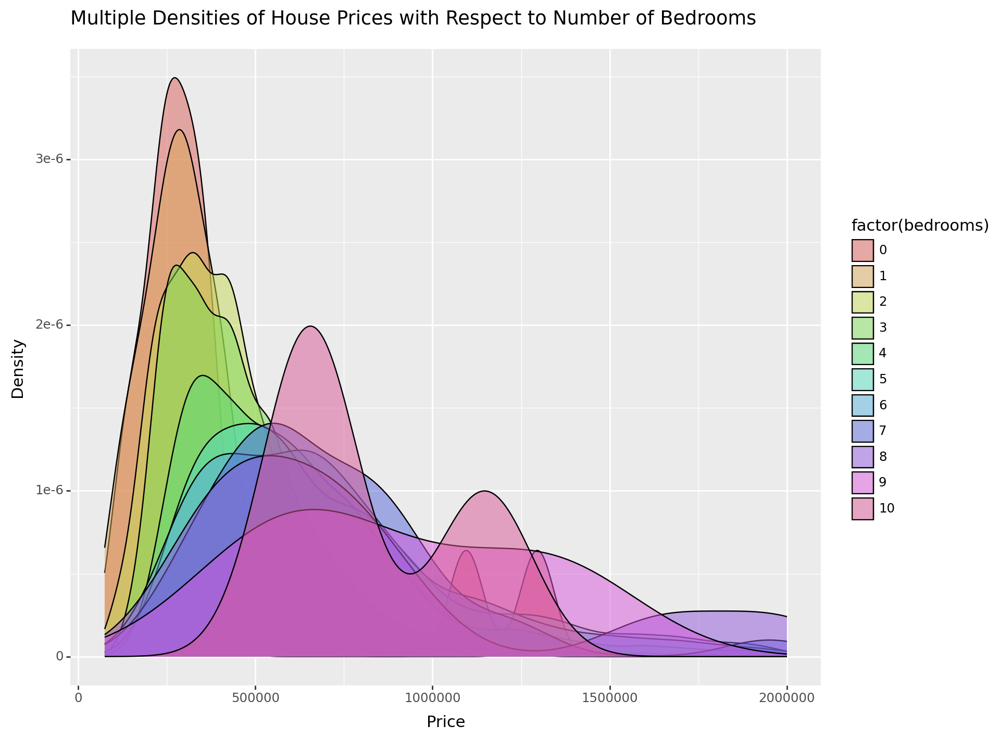

In [10]:
# Your Code Here
# ------------------------
pn.options.set_option('figure_size', (9.6, 7.2))
density_plot = (
    ggplot(lowprice_houses, aes(x='price', fill='factor(bedrooms)')) +
    geom_density(alpha=0.5) +
    labs(title="Multiple Densities of House Prices with Respect to Number of Bedrooms", x="Price",y='Density')
)

density_plot.draw()

This works well if there aren't too many classes. Here, we can't see much, so let's use the **facet_wrap()** to create **small multiples** to compare densities for different number of bedrooms. 

**Exercise 7:** Plot **small multiples** of **price densities** with respect to **number of bedrooms**. 

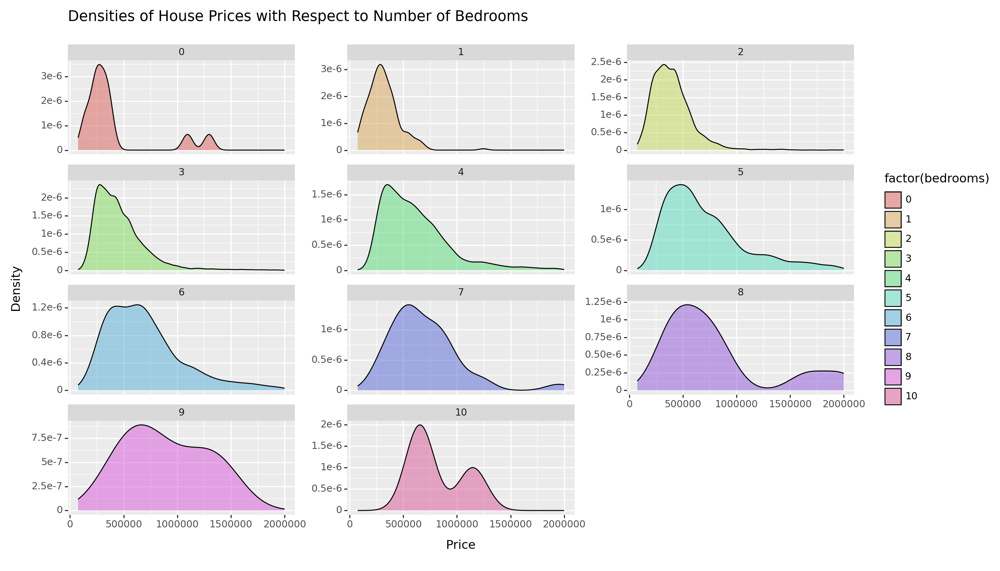

<Figure Size: (1260 x 720)>

In [11]:
# Your Code Here
# ------------------------
pn.options.set_option('figure_size', (12.6, 7.2))
rooms_price_density_plot = (
    ggplot(lowprice_houses, aes(x='price', fill='factor(bedrooms)')) +
    geom_density(alpha=0.5) +
    facet_wrap('~bedrooms', scales='free_y', ncol=3) +
    labs(title='Densities of House Prices with Respect to Number of Bedrooms', x='Price',y='Density')
)

rooms_price_density_plot

Here, we can see that the price distribution is narrowed up to four bedrooms; after that, the variance of the price increases. 
Let's see the distribution for a number of floors.

**Exercise 8:** Plot **small multiples** of **price densities** with respect to **number of floors**. 

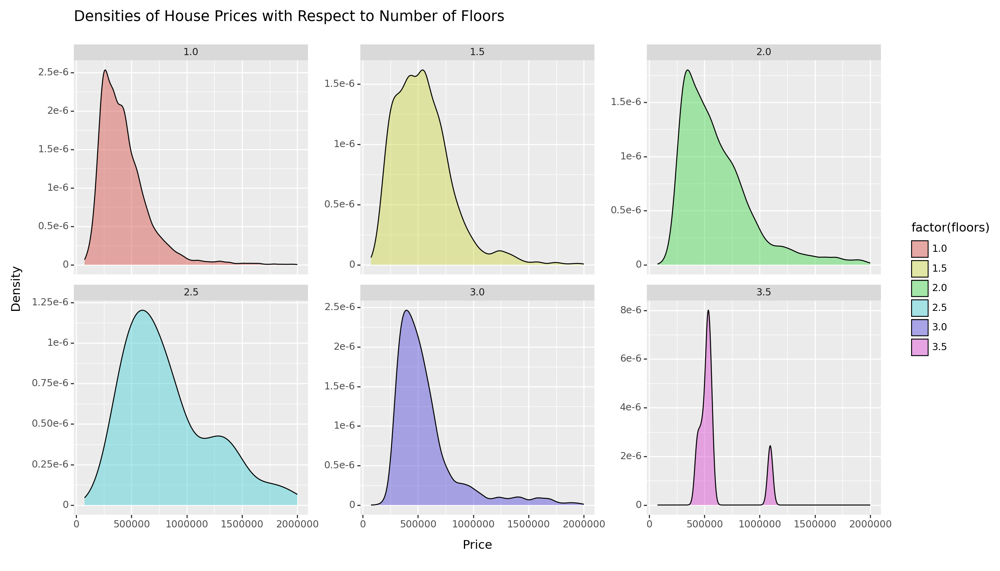

<Figure Size: (1260 x 720)>

In [12]:
# Your Code Here
# ------------------------
floor_price_density_plot = (
    ggplot(lowprice_houses, aes(x='price', fill='factor(floors)')) +
    geom_density(alpha=0.5) +
    facet_wrap('~floors', scales='free_y', ncol=3) +
    labs(title='Densities of House Prices with Respect to Number of Floors', x='Price',y='Density')
)

floor_price_density_plot

Let's plot a scatter plot for price vs. square footage using small multiples for the number of bedrooms. Map the number of floors to a *color* visual variable using a **sequential** brewer palette.

**Exercise 9:** Do a scatter plot of **price** vs. **square footage** with **small multiples** of **bedrooms**. 

In [13]:
# Adjust figure size
pn.options.set_option("figure_size", (8, 8))

(12.6, 7.2)

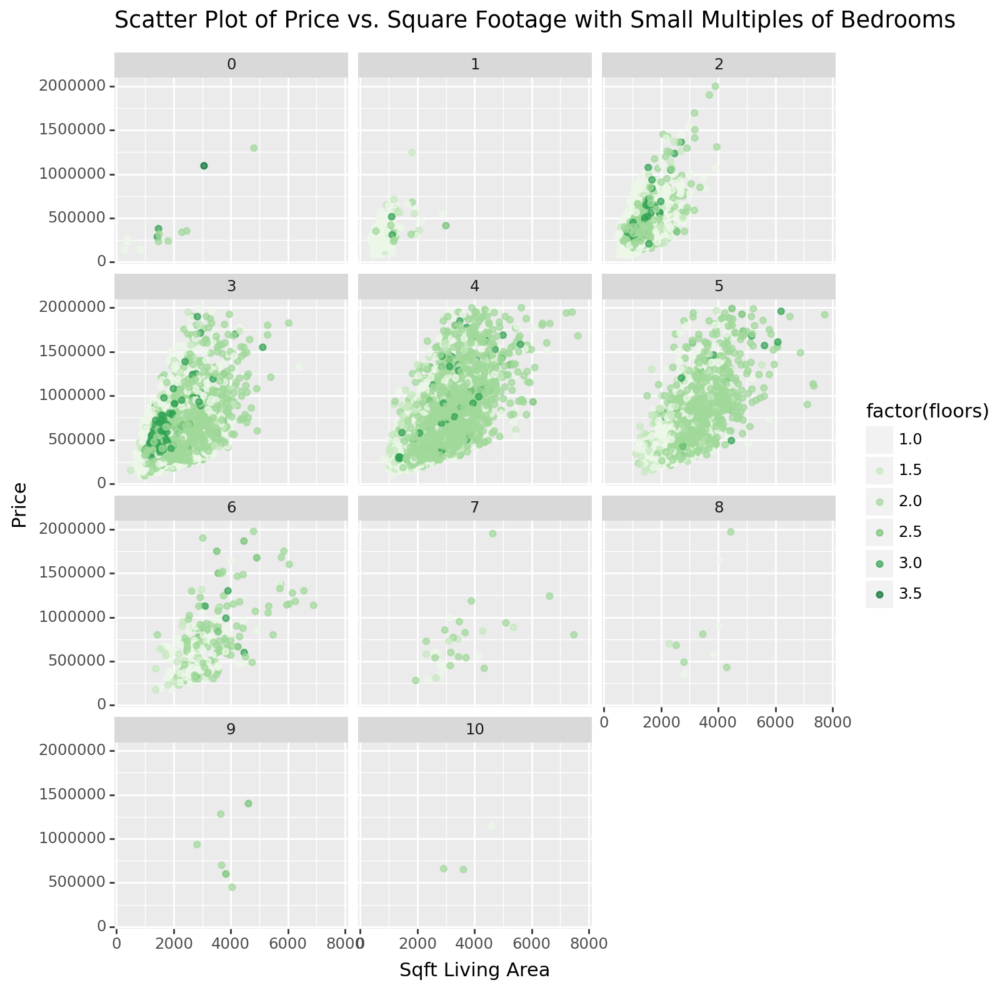

<Figure Size: (800 x 800)>

In [14]:
# Your Code Here
# ------------------------
scatter_plot_multiples = (
    ggplot(lowprice_houses, aes(x='sqft_living', y='price', color='factor(floors)')) +
    geom_point(alpha=0.7) +
    facet_wrap('~bedrooms', ncol=3) +
    scale_color_brewer(type='seq', palette='Greens') +
    labs(title='Scatter Plot of Price vs. Square Footage with Small Multiples of Bedrooms',x='Sqft Living Area',y='Price')
)

scatter_plot_multiples

**Exercise 10:** Let's make both axes log scale. 

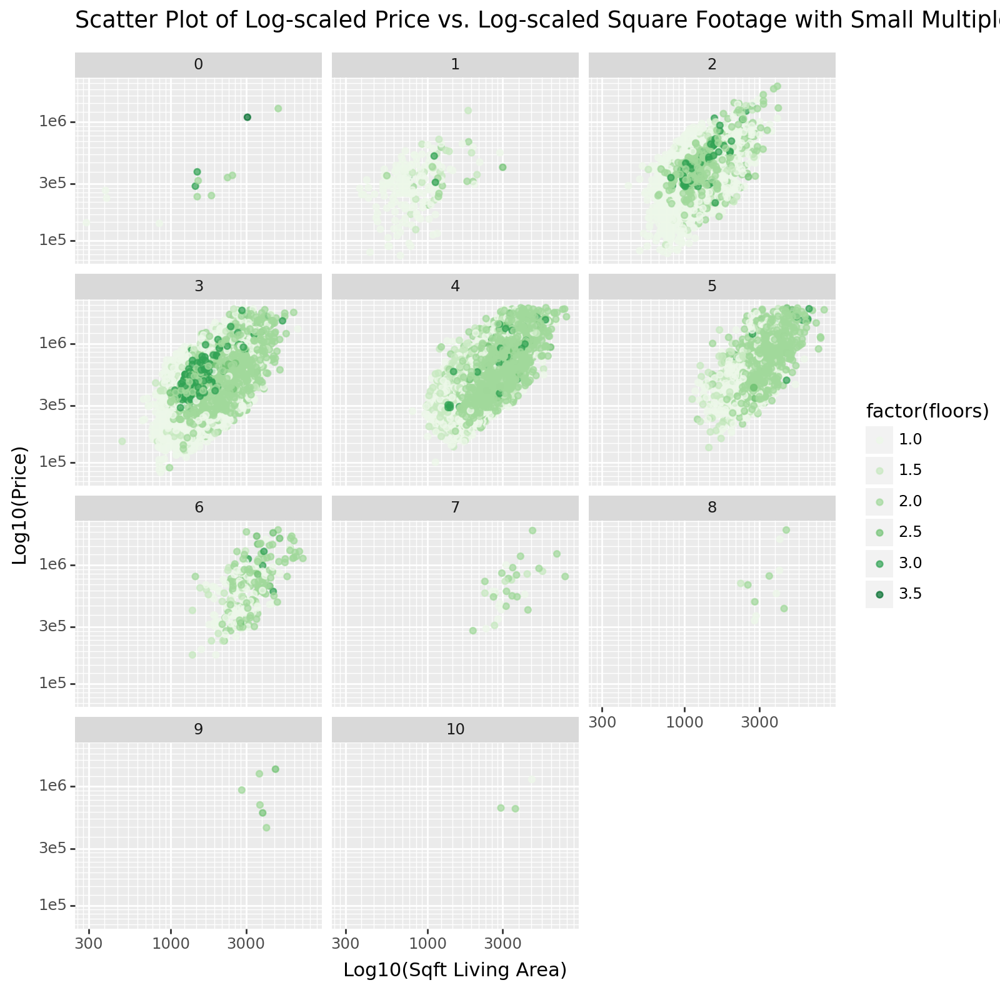

<Figure Size: (800 x 800)>

In [15]:
# Your Code Here
# ------------------------
scatter_plot_multiples_log_scale = (
    ggplot(lowprice_houses, aes(x='sqft_living', y='price', color='factor(floors)')) +
    geom_point(alpha=0.7) +
    facet_wrap('~bedrooms', ncol=3) +
    scale_color_brewer(type='seq', palette='Greens') +
    scale_x_log10() +
    scale_y_log10() +
    labs(title='Scatter Plot of Log-scaled Price vs. Log-scaled Square Footage with Small Multiples of Bedrooms',x='Log10(Sqft Living Area)',y='Log10(Price)')
    
)

scatter_plot_multiples_log_scale

---


**Let's look at a different data set. This one is about a survey of students enrolled in a class, and some information about them was collected about their behavior, demographics, etc.** 

In [16]:
ecg = pd.read_csv("eyecolorgenderdata.csv")
ecg.head()

,gender,age,year,eyecolor,height,miles,brothers,sisters,computertime,exercise,exercisehours,musiccds,playgames,watchtv
0,female,18,first,hazel,68,195.0,0,1,20.0,Yes,3.0,75.0,6.0,18.0
1,male,20,third,brown,70,120.0,3,0,24.0,No,0.0,50.0,0.0,3.0
2,female,18,first,green,67,200.0,0,1,35.0,Yes,3.0,53.0,8.0,1.0
3,male,23,fourth,hazel,74,140.0,1,1,5.0,Yes,25.0,50.0,0.0,7.0
4,female,19,second,blue,62,60.0,0,1,5.0,Yes,4.0,30.0,2.0,5.0


In [17]:
ecg = ecg.sort_values(by='age', ascending=True).reset_index(drop=True)
ecg.head()

,gender,age,year,eyecolor,height,miles,brothers,sisters,computertime,exercise,exercisehours,musiccds,playgames,watchtv
0,female,17,first,brown,66,550.0,1,1,3.0,No,0.0,100.0,0.0,10.0
1,female,17,other,brown,67,18.0,2,1,10.0,No,0.0,50.0,0.0,5.0
2,female,17,first,blue,66,60.0,1,0,30.0,Yes,5.0,9.0,0.0,20.0
3,female,18,first,brown,68,170.0,4,2,10.0,No,0.0,100.0,3.0,35.0
4,female,18,first,blue,65,359.0,2,1,2.0,No,0.0,30.0,0.0,10.0


**Exercise 11:** Name the **nominal** and **ordinal** variables in this data set. 

In [18]:
# Your Code Here
# ------------------------
nominal_variables = ['gender', 'eyecolor', 'year']
ordinal_variables = ['exercise', 'musiccds', 'playgames', 'watchtv']

print("Nominal Variables:\n",ecg[nominal_variables].head())
print("\nOrdinal Variables:\n",ecg[ordinal_variables].head())

Nominal Variables:
    gender eyecolor   year
0  female    brown  first
1  female    brown  other
2  female     blue  first
3  female    brown  first
4  female     blue  first

Ordinal Variables:
   exercise  musiccds  playgames  watchtv
0       No     100.0        0.0     10.0
1       No      50.0        0.0      5.0
2      Yes       9.0        0.0     20.0
3       No     100.0        3.0     35.0
4       No      30.0        0.0     10.0


**Answer the nominal and ordinal variables:**

Based on our dataset eyecolorgenderdata.csv, below are the nominal and ordinal variables -

***Nominal variables:***
- Gender: Represents a category (male, female) with no inherent ordering.
- Eye Color: Categories of eye color (brown, hazel, green, blue) in no particular order.
- Year: Indicates the school year (first, second, third, fourth) in no natural order.

***Ordinal variables:***
- Exercise: Indicates whether the student performs the exercise (yes, no), but in no particular order.
- musiccds: Indicates the number of music CDs. Although there is an order, it is also count data.
- playgames: Indicates the time spent playing games, in order.
- watchtv: Shows the time you watched TV in order.


**Exercise 12:** Plot a scatter plot of **gender** vs. **eyecolor**.

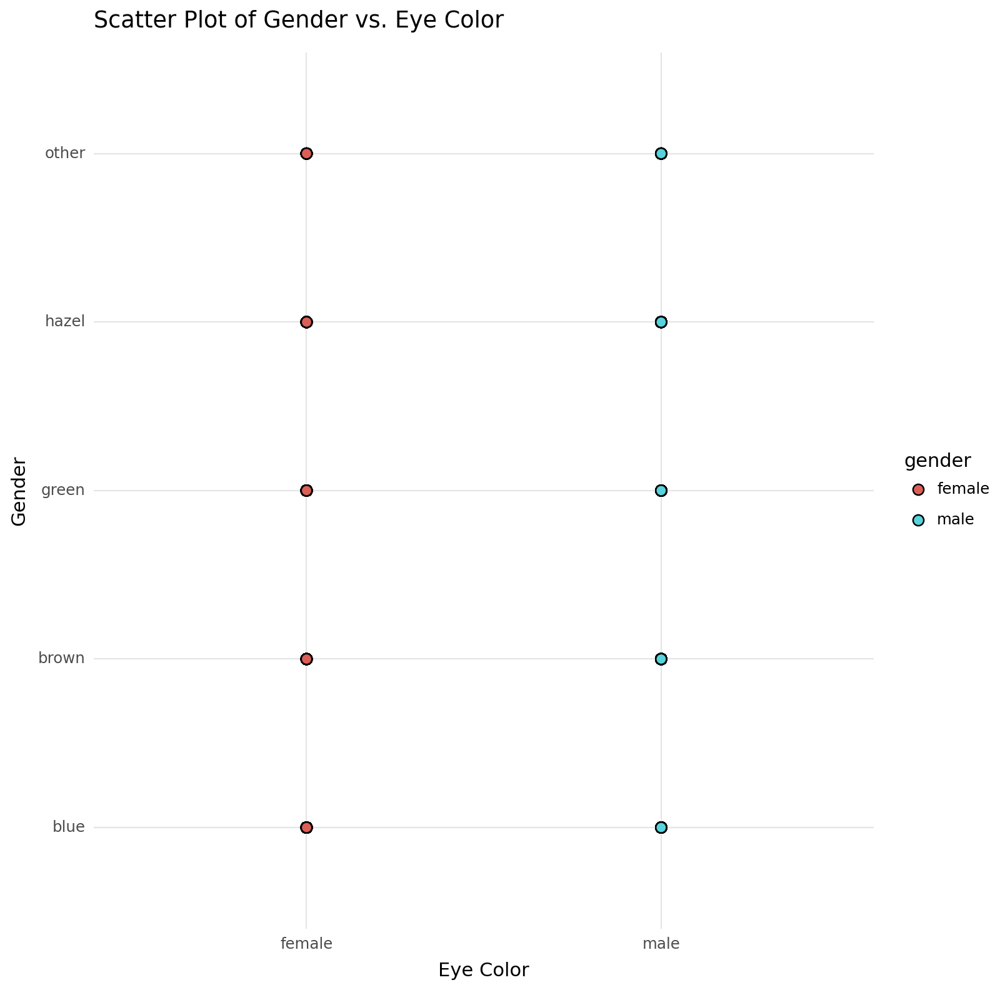

<Figure Size: (800 x 800)>

In [19]:
# Your Code Here
# ------------------------
scatter_plot_ggplot = (
    ggplot(ecg, aes(x='gender', y='eyecolor', fill='gender')) +
    geom_point(size=3, shape='o') +
    labs(title='Scatter Plot of Gender vs. Eye Color',x='Eye Color',y='Gender') +
    theme_minimal()
)

scatter_plot_ggplot

This didn't work well. When we have overplotting problem where attributes have same exact values for a large number of data rows, we should use geom_jitter() to randomly place points in a scatter plot.

**Exercise 13:** Plot a scatter plot of **gender** vs. **eyecolor** with **jitter** geometry. 

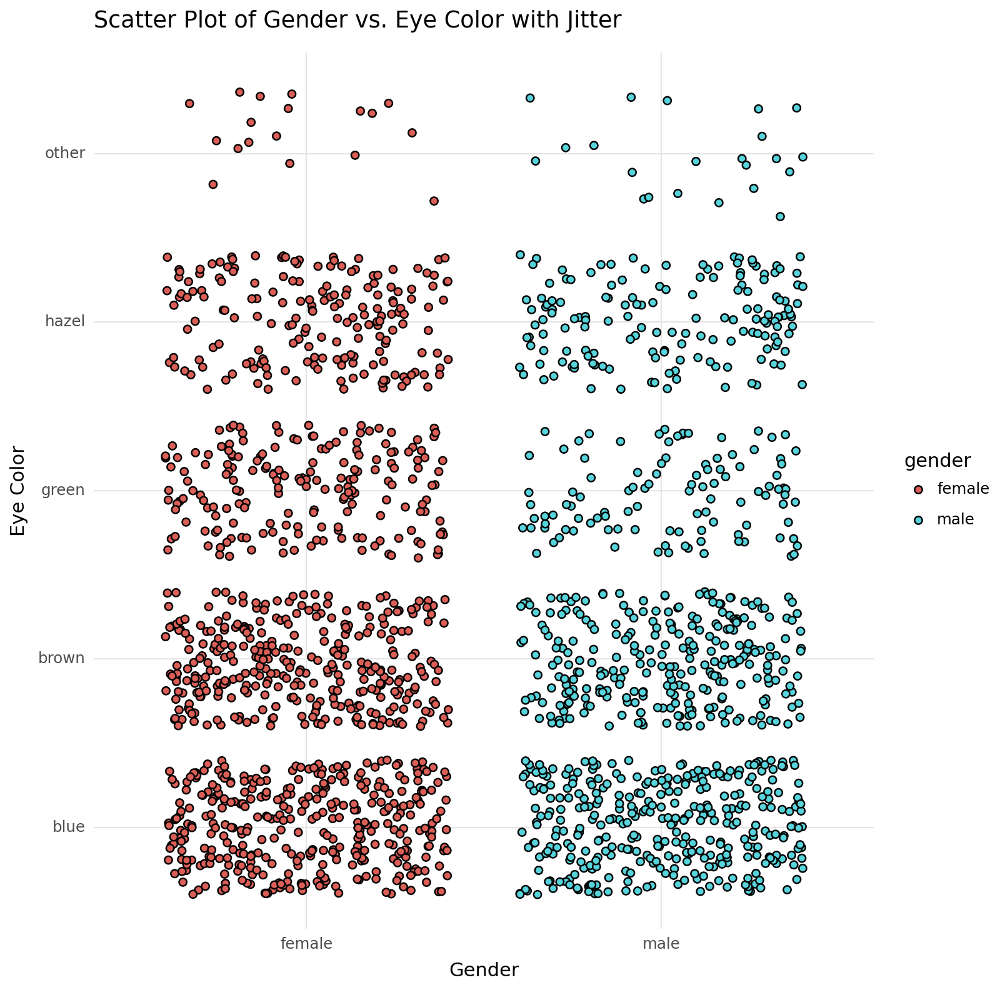

<Figure Size: (800 x 800)>

In [20]:
# Your Code Here
# ------------------------
scatter_plot_jitter = (ggplot(ecg ,aes(x='gender', y='eyecolor', fill='gender')) +
         geom_jitter(size=2, shape='o') +
         labs(title='Scatter Plot of Gender vs. Eye Color with Jitter',x='Gender',y='Eye Color') +
         theme_minimal()
        )
scatter_plot_jitter

It's intuitive to use **color** visual variable for the **eyecolor** attribute.

**Exercise 14:** Plot a scatter plot of **gender** vs. **eyecolor** and use **color** for the **eyecolor** attribute. Adjust width and height of **jitter** suitably and add transparency. 

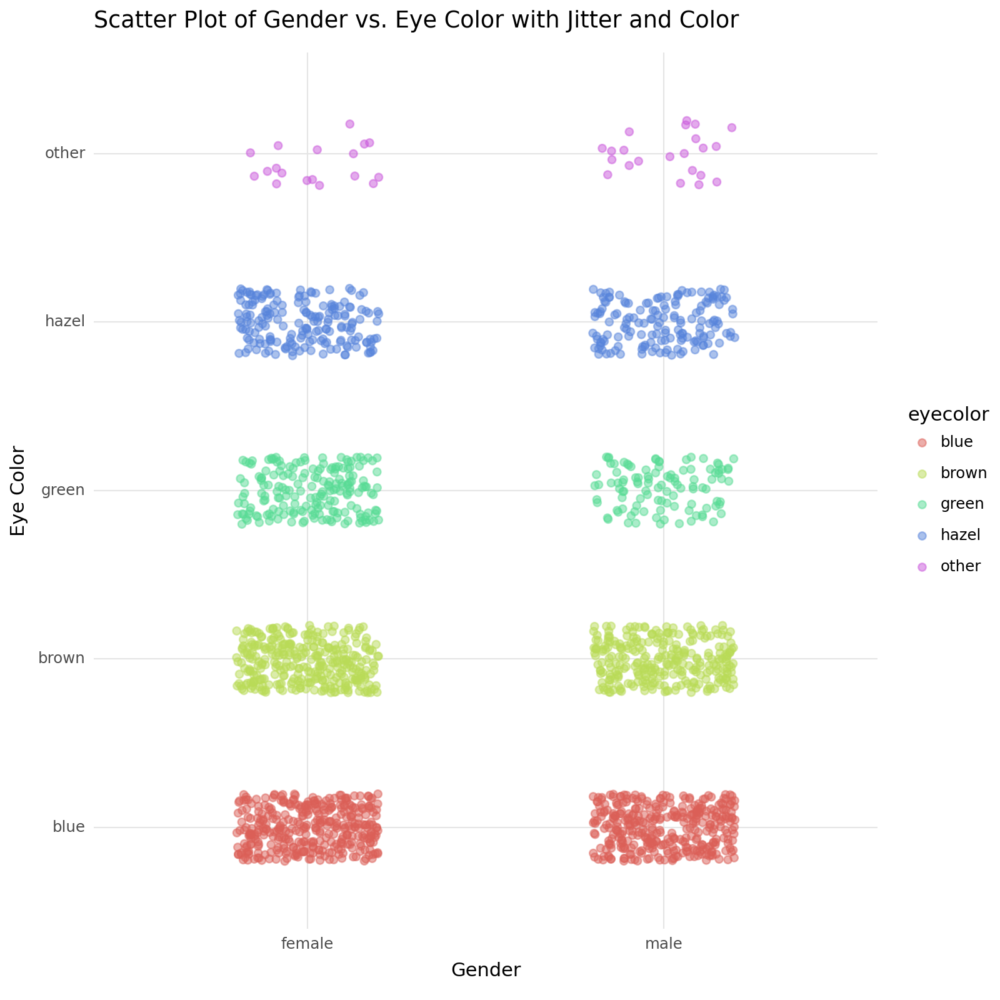

<Figure Size: (800 x 800)>

In [21]:
# Your Code Here
# ------------------------
scatter_plot_jitter_color = (
    ggplot(ecg, aes(x='gender', y='eyecolor', color='eyecolor')) +
    geom_jitter(size=2, shape='o', width=0.2, height=0.2, alpha=0.5) +
    labs(title='Scatter Plot of Gender vs. Eye Color with Jitter and Color',x='Gender',y='Eye Color') +
    theme_minimal()
)

scatter_plot_jitter_color

The colors should be intuitive, so we will manually name them with **scale_color_manual()** where the color values will be 
**c("blue", "chocolate4", "green4", "#595c26", "black")**.

For the Python user, the above `chocolate4` color does not exist. Please use the following customized color palette:
**\["blue", "#b25819", "00b200", "#595c26", "#fcc203"\]**.

**Exercise 15:** Add manual colors to the above plot.

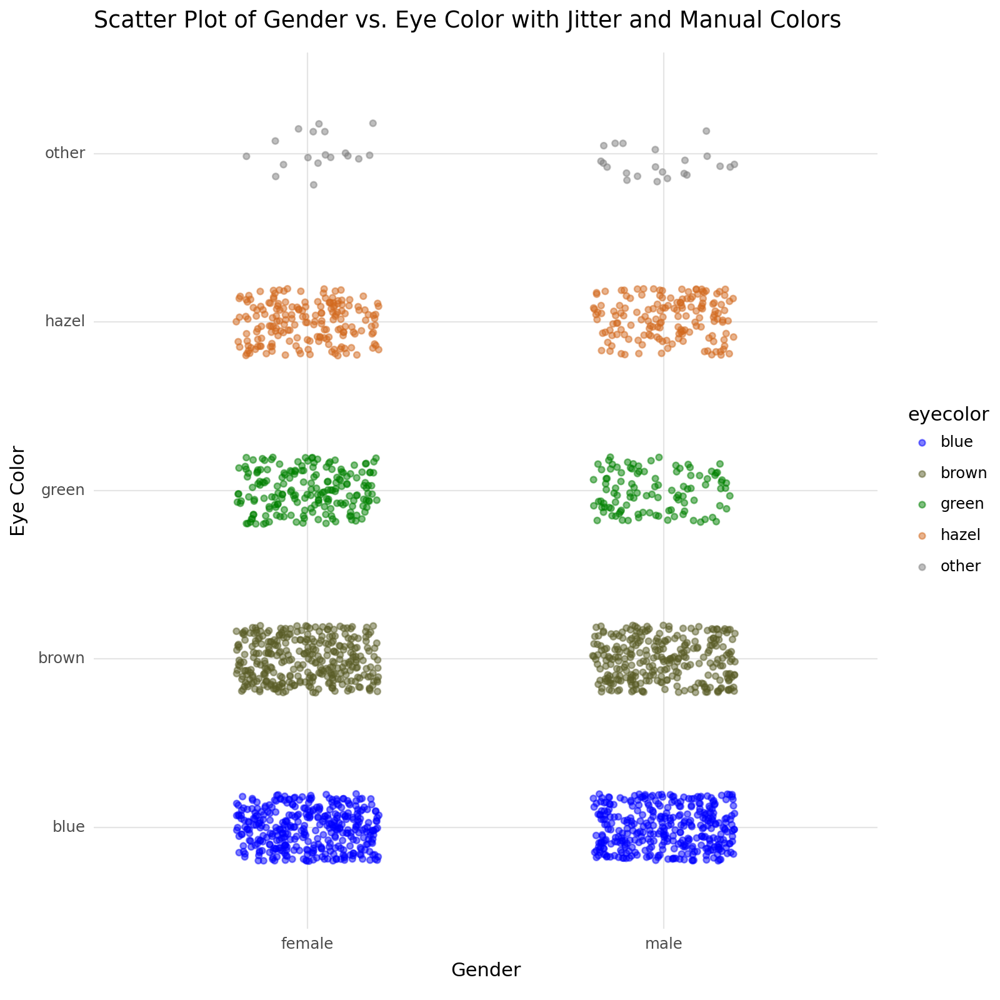

<Figure Size: (800 x 800)>

In [22]:
# Your Code Here
# ------------------------
# Black is not intuitive for the category "other" because
# some people (or at least 30% of the world population based on
# 2018 UN data) directly think that it is for a black eye.
# So instead of black, I use yellow, which usually does not exist except for illness.

manual_color_values = {'brown': '#595c26', 'hazel': '#D2691E', 'green': '#008000', 'blue': 'blue', 'unknown': 'black'}

scatter_plot_jitter_color_manual = (
    ggplot(ecg, aes(x='gender', y='eyecolor', color='eyecolor')) +
    geom_jitter(shape='o', width=0.2, height=0.2, alpha=0.5) +
    scale_color_manual(values=manual_color_values) +  
    labs(title='Scatter Plot of Gender vs. Eye Color with Jitter and Manual Colors',x='Gender',y='Eye Color') +
    theme_minimal()
)

scatter_plot_jitter_color_manual

**Exercise 16:** And finally add **shape** visual variable to encode the **exercise** attribute. **Does it work well? Why?** 


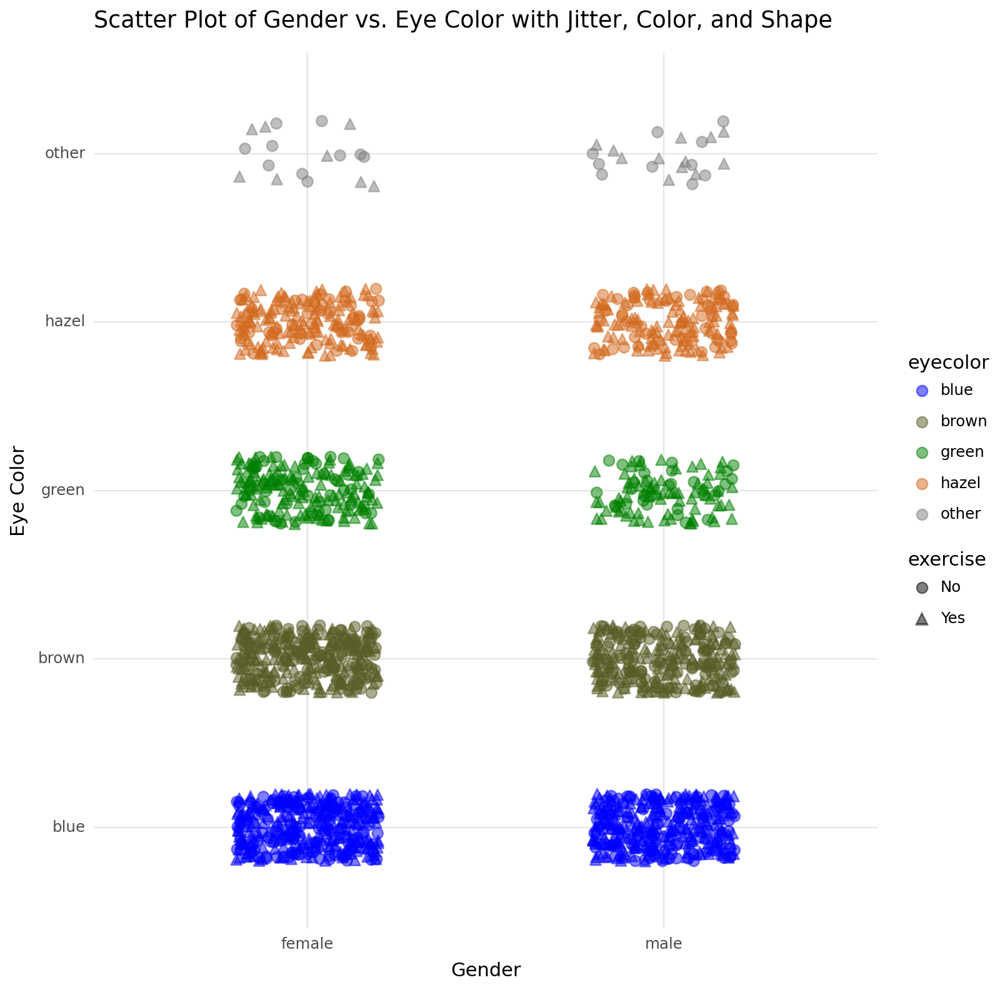

In [23]:
# Your Code Here
# ------------------------
manual_color_values = {'brown': '#595c26', 'hazel': '#D2691E', 'green': '#008000', 'blue': 'blue', 'unknown': 'black'}

scatter_plot_jitter_color_manual = (
    ggplot(ecg, aes(x='gender', y='eyecolor', color='eyecolor', shape='exercise')) +
    geom_jitter(size=3, width=0.2, height=0.2, alpha=0.5) +
    scale_color_manual(values=manual_color_values) +    
    labs(title='Scatter Plot of Gender vs. Eye Color with Jitter, Color, and Shape',x='Gender',y='Eye Color') +
    theme_minimal()

)

scatter_plot_jitter_color_manual.draw()

**Answer whether the shape visual variable works well and why:**

The different shapes effectively separate the two levels, providing a clear visual representation of the 'exercise' attribute in the scatterplot.\nA point where 'exercise' is 'Yes' is represented by a triangle, and a point where 'exercise' is 'No' is represented by a circle.


**Exercise 17:** Plot a scatter plot of **gender** vs. **height** with **small multiples** for **exercise**. 

**Use the techniques you applied in the above exercises. Use intuitive visual variables for the attributes.** 


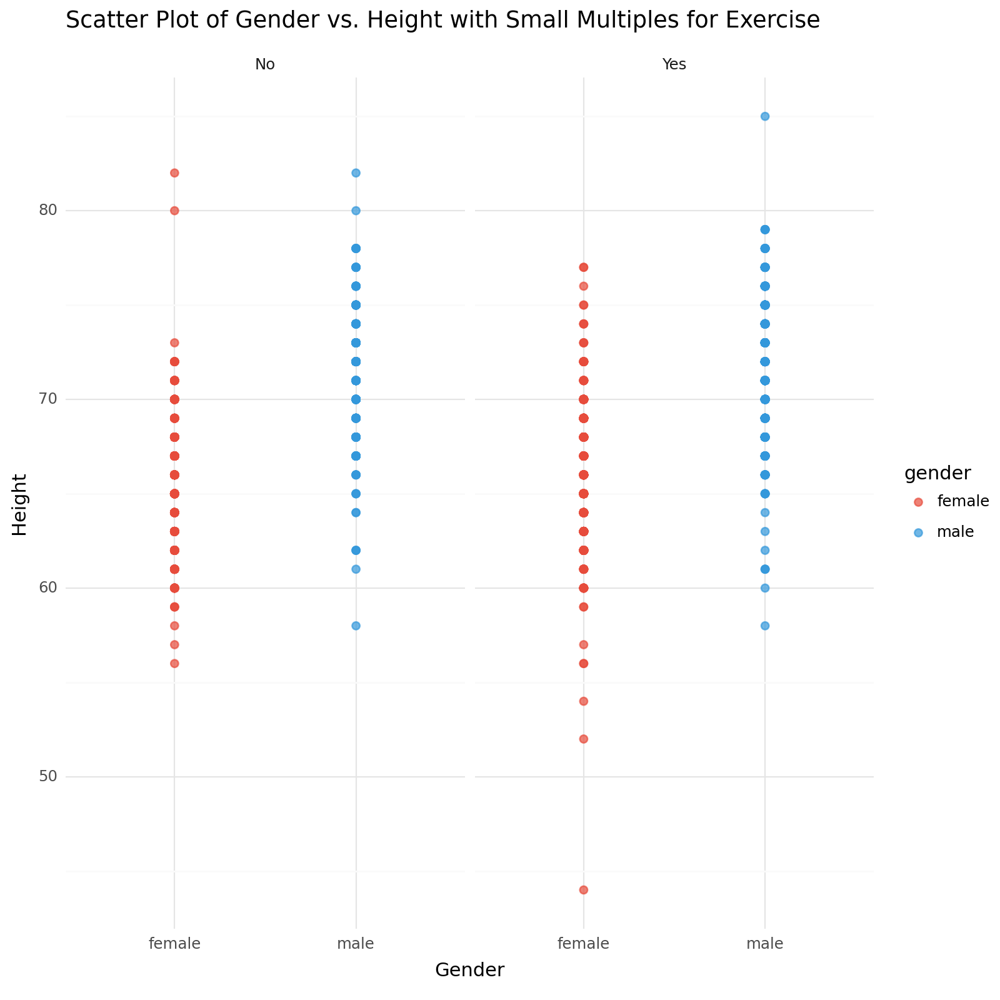

<Figure Size: (800 x 800)>

In [24]:
# Your Code Here
# ------------------------
gender_colors = {'male': '#3498db', 'female': '#e74c3c'}
scatter_plot_height_exercise = (
    ggplot(ecg, aes(x='gender', y='height', color='gender')) +
    geom_point(size=2, shape='o', alpha=0.7) +
    facet_wrap('~exercise') +    
    labs(title='Scatter Plot of Gender vs. Height with Small Multiples for Exercise',x='Gender',y='Height') +
    scale_color_manual(values=gender_colors) +
    theme_minimal()
)

scatter_plot_height_exercise

-----

Let's read the Gapminder data from the web resource.

In [25]:
import plotly as pl

world_pop = pd.read_csv(
    "/".join(
        [
            "https://raw.githubusercontent.com",
            "plotly/datasets",
            "master/gapminderDataFiveYear.csv",
        ]
    )
)
world_pop.head()

,country,year,pop,continent,lifeExp,gdpPercap
0,Afghanistan,1952,8425333.0,Asia,28.801,779.445314
1,Afghanistan,1957,9240934.0,Asia,30.332,820.853030
2,Afghanistan,1962,10267083.0,Asia,31.997,853.100710
3,Afghanistan,1967,11537966.0,Asia,34.020,836.197138
4,Afghanistan,1972,13079460.0,Asia,36.088,739.981106


**Exercise 18:** Create a subset of the data between the years 1951 and 1993. Then, display the U.S. table using `country=='United States'`. 

In [26]:
# Your Code Here
# ------------------------
subset_df=world_pop[(world_pop['year']>1951) & (world_pop['year']<1994)].drop_duplicates().reset_index(drop=True)
print(subset_df['year'].unique())
print(subset_df.shape)
subset_df.head()

[1952 1957 1962 1967 1972 1977 1982 1987 1992]
(1278, 6)


,country,year,pop,continent,lifeExp,gdpPercap
0,Afghanistan,1952,8425333.0,Asia,28.801,779.445314
1,Afghanistan,1957,9240934.0,Asia,30.332,820.853030
2,Afghanistan,1962,10267083.0,Asia,31.997,853.100710
3,Afghanistan,1967,11537966.0,Asia,34.020,836.197138
4,Afghanistan,1972,13079460.0,Asia,36.088,739.981106


**Exercise 19:** Plot **small multiples of histograms** of **life expectancy for each year** for the subset. Use a binwidth of **5**, and use sensible axis labels.

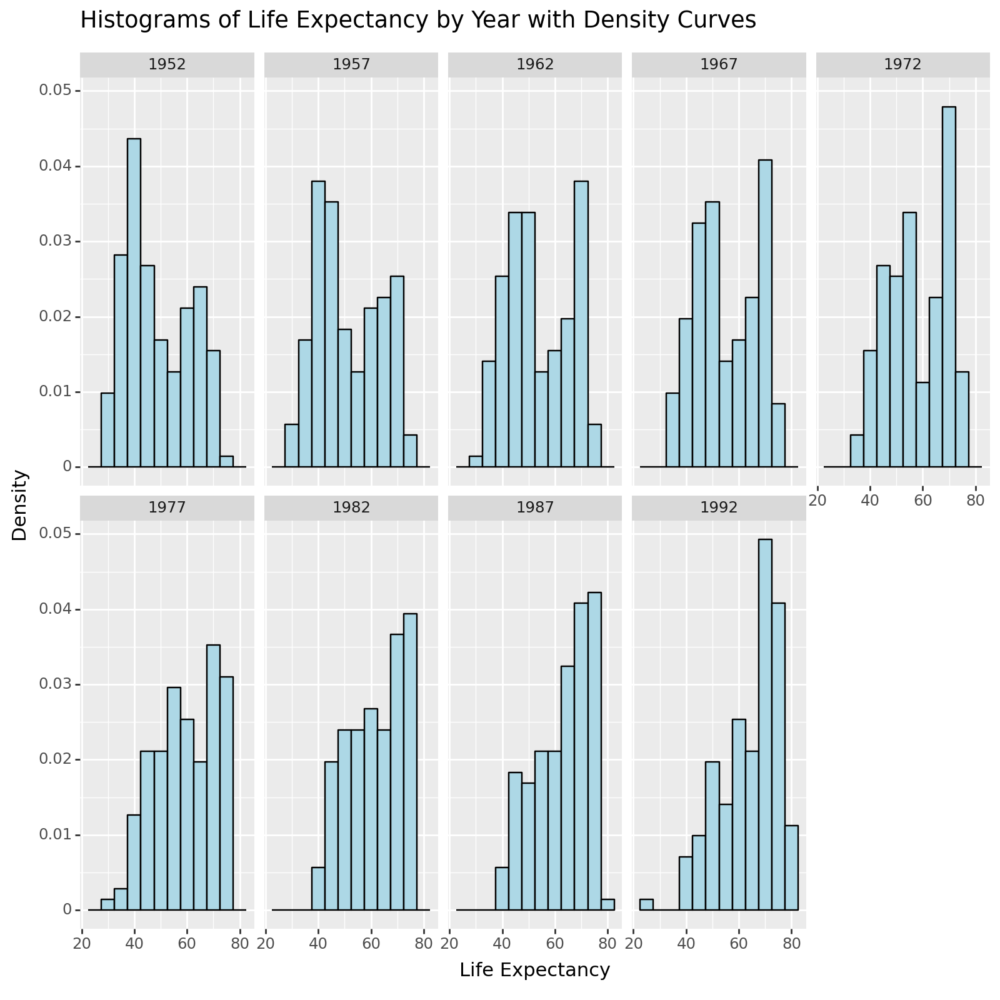

<Figure Size: (800 x 800)>

In [27]:
# Your Code Here
# ------------------------
# Create the plot
histogram_plot = ggplot(subset_df, aes(x='lifeExp')) + \
       geom_histogram(aes(y=after_stat("density")), color='black', fill='lightblue', binwidth=5) + \
       facet_wrap('~year', ncol=5) + \
       labs(title='Histograms of Life Expectancy by Year with Density Curves',
            x='Life Expectancy',
            y='Density')

# Display the plot
histogram_plot

**Exercise 20:** (1) Do the same as above, but plot a density function this time. (2) How do you interpret the change of density in years?

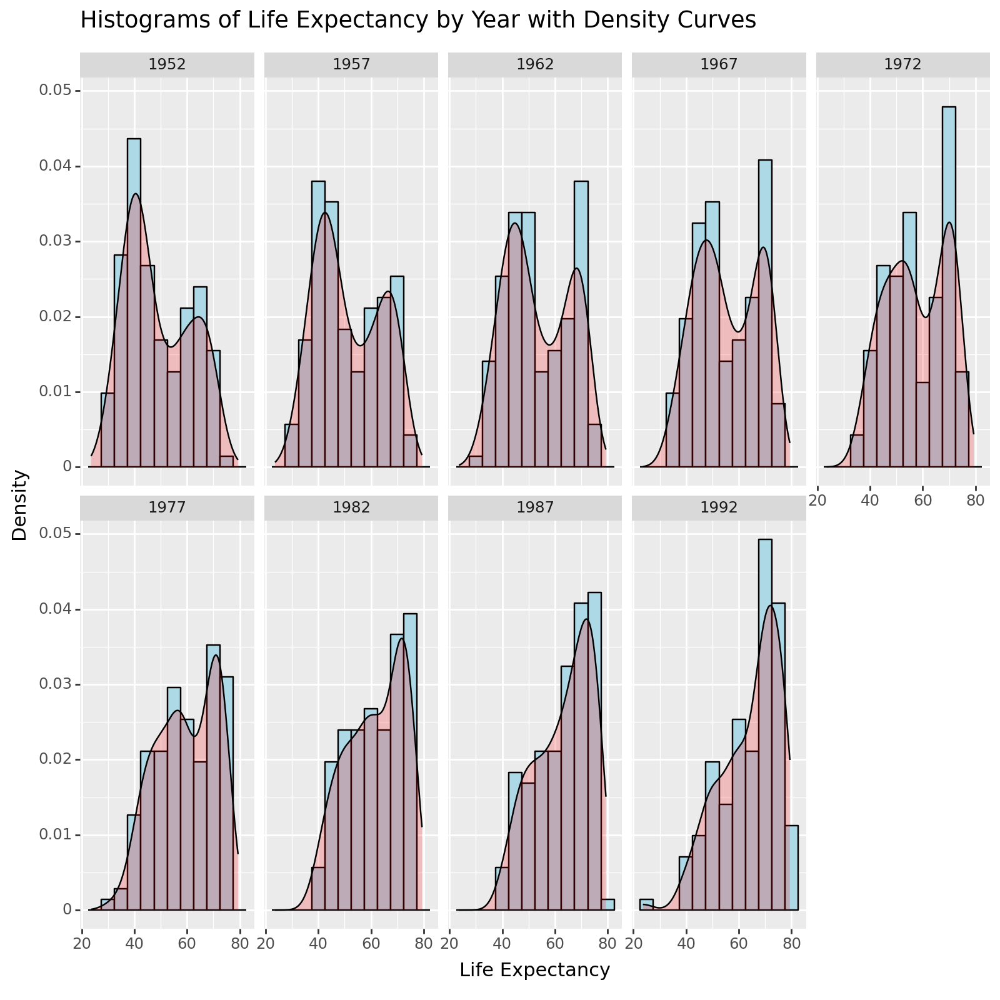

<Figure Size: (800 x 800)>

In [28]:
# Your Code Here
# ------------------------
# Create the plot
density_plot = ggplot(subset_df, aes(x='lifeExp')) + \
       geom_histogram(aes(y=after_stat("density")), color='black', fill='lightblue', binwidth=5) + \
       geom_density(alpha = .2, fill="red") +\
       facet_wrap('~year', ncol=5) + \
       labs(title='Histograms of Life Expectancy by Year with Density Curves',
            x='Life Expectancy',
            y='Density')

# Display the plot
density_plot


**Answer how to interpret**: 

Over time, the life expectancy distribution is moving to the right, suggesting an increase in life expectancy.

The peak density rises and the variance falls as the density curves get narrower and higher. This indicates that life expectancy is less scattered and more concentrated around a higher value.
The distribution is broader and the peak density is roughly 60 years lower in previous years, such as 1952.

Later years, such as 1993, have a smaller distribution with a 75-year peak density.
The overlapping density graphs make this constriction and move to the right quite evident.
In conclusion, the density plots show that life expectancy is rising over time; not only is the mean rising, but as life expectancy becomes concentrated around higher values with time, the variance is also falling.

**Exercise 21:** Create a line plot (use both geom_line and geom_point) to plot year versus population for the **whole** data set. Use a logarithmic scale in **y axis** and **group by country**, **color by continent**. Can you see any pattern? 

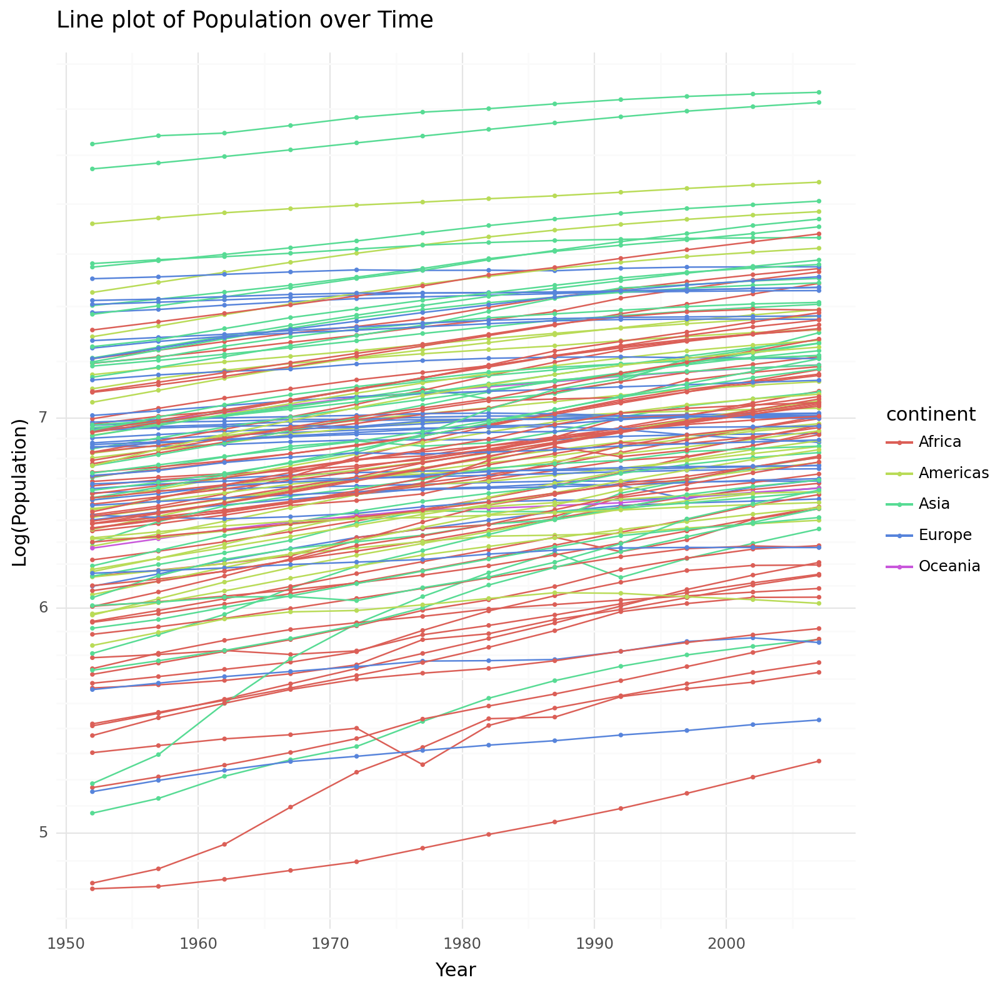

<Figure Size: (800 x 800)>

In [29]:
# Your Code Here
# ------------------------
import numpy as np
world_pop['log_pop'] = world_pop['pop'].apply(lambda x: None if x == 0 else np.log10(x))

line_plot = (
    ggplot(world_pop, aes(x='year', y='log_pop', color='continent')) +
    geom_line(aes(group='country')) +
    geom_point(aes(group='country'), size=0.5) +
    scale_y_continuous(trans='log10') +
    labs(title="Line plot of Population over Time", x="Year", y="Log(Population)") +
    theme_minimal() +
    theme(legend_position="right")
)

line_plot

_**Can you see any pattern?**_

**Answer here:**

Although it is hard to separate by each continent, there is an upward trend over year.

---

**Aggregate data:** The above plot is too crowded to see. Let's aggregate data by continent and year so we can plot meaningful data. The following code creates a new data frame by computing the sums of the population for years and continents.

In [30]:
aggdata = (
    world_pop.groupby(["continent", "year"])["pop"].sum().to_frame("x").reset_index()
)
aggdata.head()

,continent,year,x
0,Africa,1952,237640501.0
1,Africa,1957,264837738.0
2,Africa,1962,296516865.0
3,Africa,1967,335289489.0
4,Africa,1972,379879541.0


**Exercise 22:** Now (1) **repeat Exercise 21 with this aggregate data** and group and color by continent. (2) Do you see a pattern? 

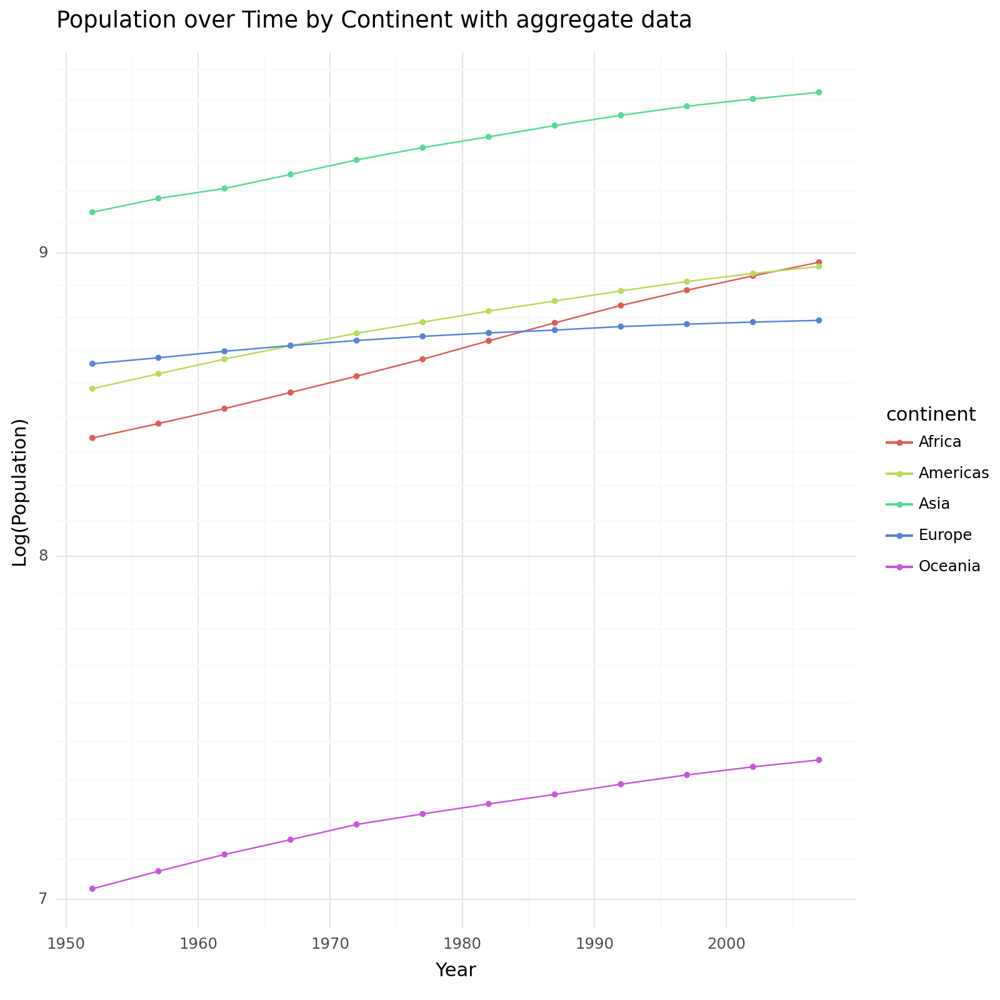

<Figure Size: (800 x 800)>

In [31]:
# Your Code Here
# ------------------------
aggdata['log_pop'] = aggdata['x'].apply(lambda x: None if x == 0 else np.log10(x))

aggregate_data_line_plot = (
    ggplot(aggdata, aes(x='year', y='log_pop', color='continent')) +
    geom_line() +
    geom_point(size=1) +
    scale_y_continuous(trans='log10') +
    labs(title="Population over Time by Continent with aggregate data", x="Year", y="Log(Population)") +
    theme_minimal() +
    theme(legend_position="right")
)

aggregate_data_line_plot

**Answer here your opinion whether you can see a pattern:**


Yes, after examining the plot, I can observe several patterns in the population trends across continents over time.
For example, it seems that, albeit at different rates, population growth has been consistent throughout all continents.
Africa and Asia have experienced exceptionally high rates of population growth over time, with steep increasing trends.
Oceania and the Americas, on the other hand, are seeing more steady population growth.
Comparatively speaking, only Europe exhibits a fairly modest population increase.

**Exercise 23:** Now, plot a **stacked area chart** to see the same. Instead of group and color, use only **fill** parameter for **continent**, and use **geom_area**.

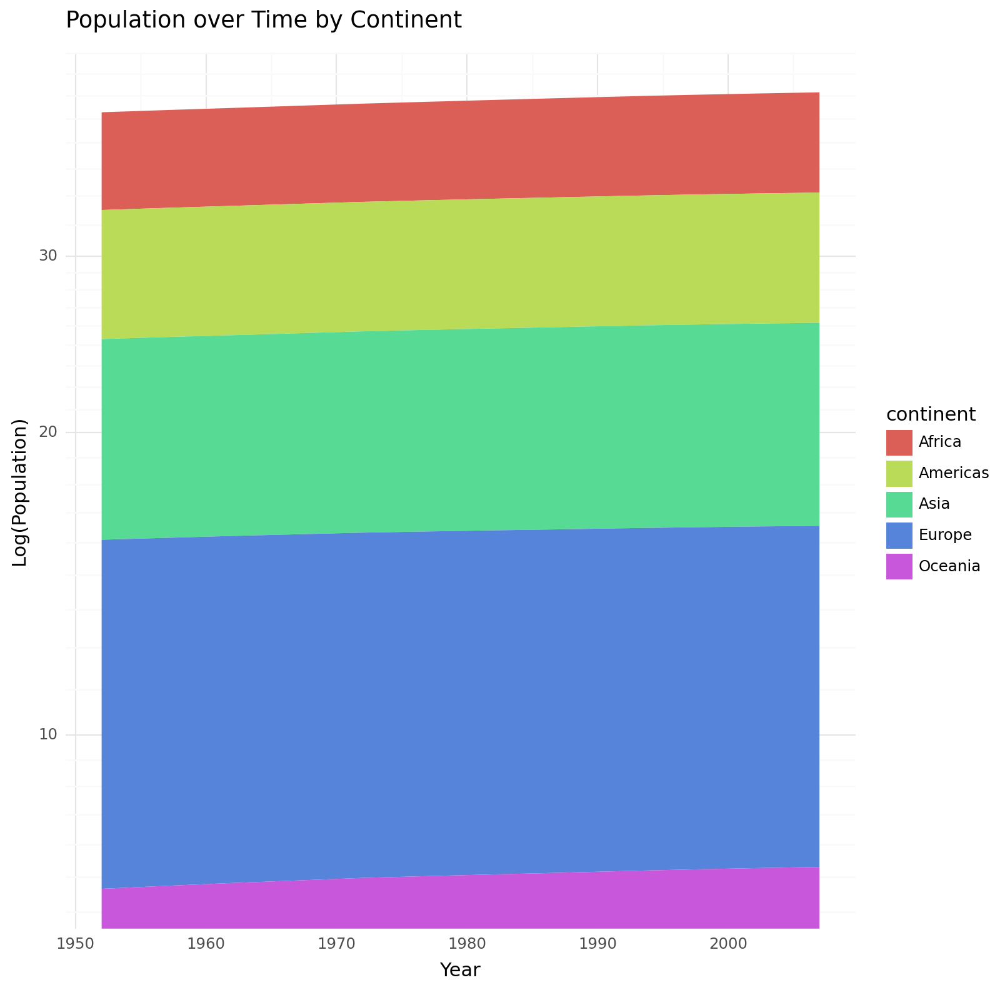

<Figure Size: (800 x 800)>

In [32]:
# Your Code Here
# ------------------------

aggdata['log_pop'] = aggdata['x'].apply(lambda x: None if x == 0 else np.log10(x))

stacked_area_chart = (
    ggplot(aggdata, aes(x='year', y='log_pop', fill='continent')) +
    geom_area() +
    scale_y_continuous(trans='log10') +
    labs(title="Population over Time by Continent", x="Year", y="Log(Population)") +
    theme_minimal() +
    theme(legend_position="right")
)

stacked_area_chart

---

**Find percentages:** The above plot shows actual population numbers, which grow in time. We want to see the percentage change of the continents' populations with respect to the total world population. The code below computes that. 

In [33]:
aggdata["percent.pop"] = (
    aggdata["x"] / aggdata.groupby(["year"])["x"].transform("sum") * 100
)
aggdata.head()

,continent,year,x,log_pop,percent.pop
0,Africa,1952,237640501.0,8.375920,9.873067
1,Africa,1957,264837738.0,8.422980,9.939847
2,Africa,1962,296516865.0,8.472049,10.225485
3,Africa,1967,335289489.0,8.525420,10.420878
4,Africa,1972,379879541.0,8.579646,10.620128


**Exercise 24:** Now, **plot the same as exercise 23** but use **percent.pop** as the y axis. 

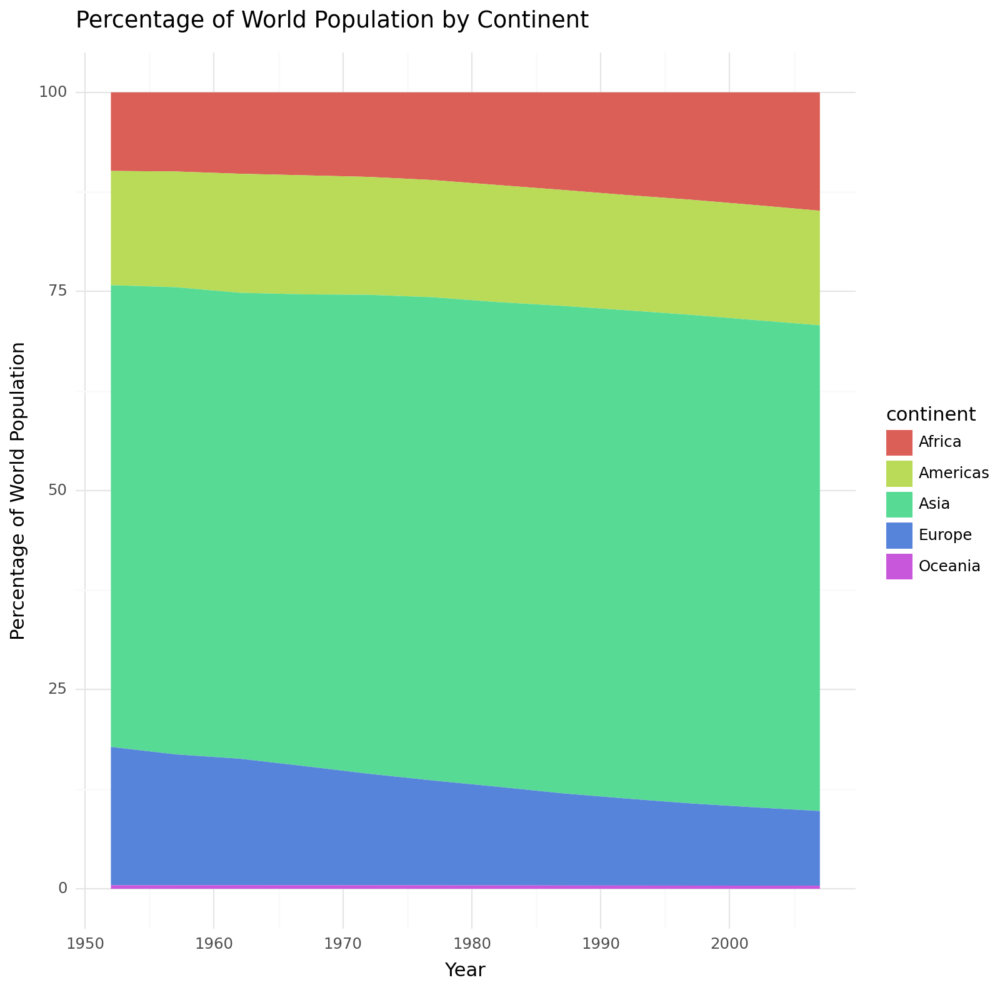

<Figure Size: (800 x 800)>

In [34]:
# Your Code Here
# ------------------------

stacked_area_chart_perc = (
    ggplot(aggdata, aes(x='year', y='percent.pop', fill='continent')) +
    geom_area() +
    labs(title="Percentage of World Population by Continent", x="Year", y="Percentage of World Population") +
    theme_minimal() +
    theme(legend_position="right")
)

stacked_area_chart_perc

**Exercise 25:** We will aggregate once more; this time we will compute the **mean GDP per capita for continents and years**. **It's your turn this time.**

In [35]:
# Your Code Here
# ------------------------
aggdata_gdp = (
    world_pop
    .groupby(["continent", "year"])["gdpPercap"]
    .mean().to_frame("newgdp").reset_index()
)

aggdata_gdp.head()


,continent,year,newgdp
0,Africa,1952,1252.572466
1,Africa,1957,1385.236062
2,Africa,1962,1598.078825
3,Africa,1967,2050.363801
4,Africa,1972,2339.615674


**Exercise 26:** Plot a **heatmap** using **plot_ly function** for **years** vs. **continents** using the **mean gdp per capita as the z value**. 

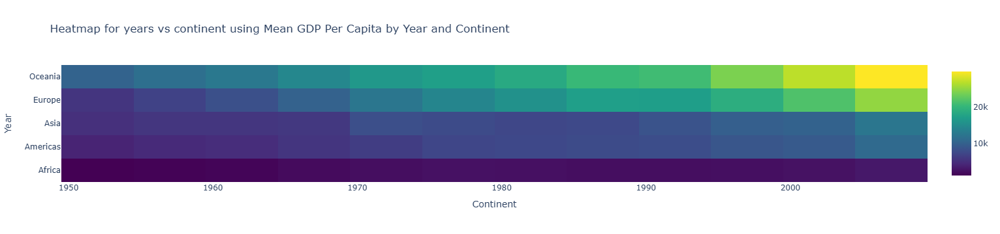

In [36]:
# Your Code Here
# ------------------------

import plotly.graph_objs as go

heatmap_plot = go.Heatmap(
    x=aggdata_gdp["year"],
    y=aggdata_gdp["continent"],
    z=aggdata_gdp["newgdp"],
    colorscale='Viridis',
)

final_layout = go.Layout(
    title="Heatmap for years vs continent using Mean GDP Per Capita by Year and Continent",
    xaxis=dict(title="Continent"),
    yaxis=dict(title="Year"),
)

fig = go.Figure(data=[heatmap_plot], layout=final_layout)
fig

**Exercise 27:** Plot a **boxplot** for **gdp per capita** using **plot_ly function** for **continents**. 

Use the **whole** data set, **color by continent**, and make sure the **y-axis is in log scale**. 

**When hovering over data, what do you notice about the first and third quartiles for each continent (hint: think of income inequality) ?** 

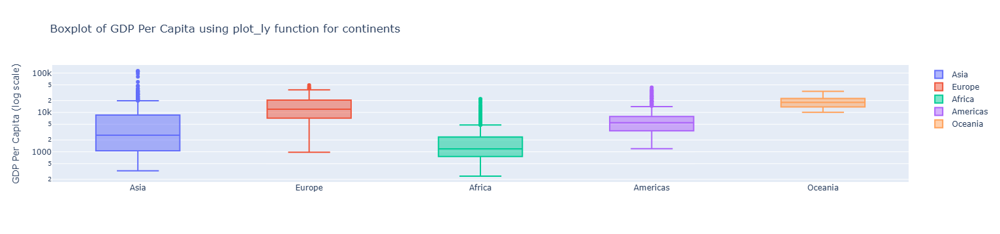

In [38]:
# Your Code Here
# ------------------------

import plotly.graph_objects as go

boxplot = []

for continent in world_pop['continent'].unique():
    boxplot.append(
        go.Box(
            y=world_pop[world_pop['continent'] == continent]['gdpPercap'],
            name=continent
        )
    )

plot_layout = go.Layout(
    title="Boxplot of GDP Per Capita using plot_ly function for continents",
    yaxis=dict(title="GDP Per Capita (log scale)", type="log")
)

fig = go.Figure(data=boxplot, layout=plot_layout)
fig

**Answer your thought about the first and third quartiles for each continent:**

With regard to Asia, the disparity in income between the first and third quartiles is roughly 7509, suggesting a modest degree of inequality across the continent.
Compared to other continents, Europe has a higher gap of approximately 12810. This suggests that income inequality is lower in Europe.
On the other hand, the Americas exhibit a moderate difference of about 4428, indicating moderate income disparity, whereas Africa shows a considerably smaller difference of about 1617, indicating higher income inequality.
Oceania exhibits a discrepancy of around 9000, indicating a considerable degree of wealth disparity across the continent.


### Please write your answer and execute all codes to display data visualization.
### Save your answer. (File->Save Notebook, Ctrl+S or Command+S)
### After save your notebook, please submit yours to Blackboard.